In [6]:
%pylab inline
import os
import detect3D
import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser

try:
    import ipyvolume as ipv
except ImportError:
    raise ImportError('install ipyvolume for display')

from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTaskNew
from sparseBase import massmapSparsityTask
figMsDir='/work/xiangchong.li/superonionGW/code/massMap_Private/doc/paper_ms_method_HSCY1/'



C_LIGHT=2.99792458e8        # m/s
GNEWTON=6.67428e-11         # m^3/kg/s^2
KG_PER_SUN=1.98892e30       # kg/M_solar
M_PER_PARSEC=3.08568025e16  # m/pc
def four_pi_G_over_c_squared():
    # = 1.5*H0^2/roh_0/c^2
    # We want it return 4piG/c^2 in unit of Mpc/M_solar
    # in unit of m/kg
    fourpiGoverc2 = 4.0*np.pi*GNEWTON/(C_LIGHT**2)
    # in unit of pc/M_solar
    fourpiGoverc2 *= KG_PER_SUN/M_PER_PARSEC
    # in unit of Mpc/M_solar
    fourpiGoverc2 /= 1.e6
    return fourpiGoverc2

Populating the interactive namespace from numpy and matplotlib


In [2]:
cd wrkDir/sim/

/work/xiangchong.li/work/massMapSparse/sim


In [3]:
lnm='nl20'
configName  =   'planck-cosmo/config-pix96-%s.ini' %lnm
parser      =   ConfigParser()
parser.read(configName)
gridInfo    =   cartesianGrid3D(parser)

In [8]:
lensKernel =   np.zeros((gridInfo.nz,gridInfo.nzl))
kl  =   gridInfo.cosmo.Da(0.,gridInfo.zlcgrid)*four_pi_G_over_c_squared()
# Surface masss density in lens bin
rhoM_ave=gridInfo.cosmo.rho_m(gridInfo.zlcgrid)
DaBin=gridInfo.cosmo.Da(gridInfo.zlbound[:-1],gridInfo.zlbound[1:])
lensKernel=kl*rhoM_ave*DaBin

In [54]:
weight0=lensKernel
print(weight0)

[0.0006079  0.00144533 0.00229296 0.00314504 0.00399638 0.00484238
 0.00567902 0.00650283 0.00731088 0.00810077 0.00887054 0.00961866
 0.01034396 0.01104564 0.01172317 0.01237626 0.01300485 0.01360907
 0.01418919 0.01474558]


In [153]:
weight=np.sqrt(np.sum(gridInfo.lensing_kernel()**2.,axis=0))
print(weight/weight0)
if True:
    weight=np.ones(len(weight))
    minR=-100
    maxR=300
else:
    minR=-0.4
    maxR=0.6

[2.97507944 2.73397961 2.50917232 2.30314432 2.11888823 1.95295743
 1.79564003 1.64765261 1.5101224  1.38445606 1.27009795 1.16457863
 1.06849612 0.97957886 0.89805031 0.82357077 0.75468641 0.69207714
 0.63508913 0.58286687]


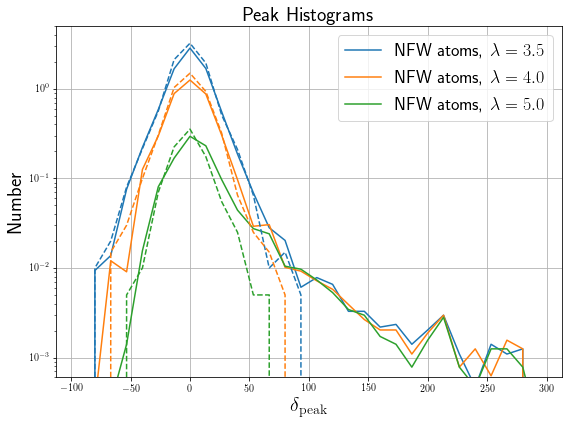

In [182]:
nbin=30
cmap=plt.get_cmap('tab10')
plt.figure(figsize=(8,6))
nmlist=['f3-1','f3-2','f3-3']
lblist=['NFW atoms, $\lambda=3.5$','NFW atoms, $\lambda=4.0$','NFW atoms, $\lambda=5.0$']

sumHist=np.zeros(len(nmlist))
for inm,nmp2 in enumerate(nmlist):
    histP=np.zeros(nbin)
    n=0
    for i in range(8):
        for j in range(8):
            n+=1
            a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nmp2,i,j))
            mask=(a['iz']<20)
            mask&=((a['value']*weight[np.int_(a['iz'])]>minR)&(a['value']*weight[np.int_(a['iz'])]<maxR))
            a=a[mask]
            if len(a)>0:
                histA,grids=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbin,range=(minR,maxR),density=False)
                histP+=histA
    grids=(grids[1:]+grids[:-1])/2.
    plt.plot(grids,histP/n/100,'-',label=r'%s'%lblist[inm],c=cmap(inm))
    sumHist[inm]=np.sum(histP)
    
for inm,nmp2 in enumerate(nmlist):
    n=5
    i=800
    j=800
    a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nmp2,i,j))
    na=len(a)
    a=a[0:na//n]
    mask=(a['iz']<20)
    a=a[mask]
    histP,grids=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbin,range=(minR,maxR),density=False)
    grids=(grids[1:]+grids[:-1])/2.
    plt.plot(grids,histP/10/100*n,'--',c=cmap(inm))
    
plt.yscale('log')
plt.ylim(6e-4,5e0)
plt.title('Peak Histograms',fontsize=20)
plt.legend(fontsize=18)
plt.grid()
plt.xlabel(r'$\delta_{\rm{peak}}$',fontsize=20)
plt.ylabel('Number',fontsize=20)
plt.tight_layout()
#plt.savefig(os.path.join(figMsDir,'peak_histograms.pdf'))

8995
4346
933


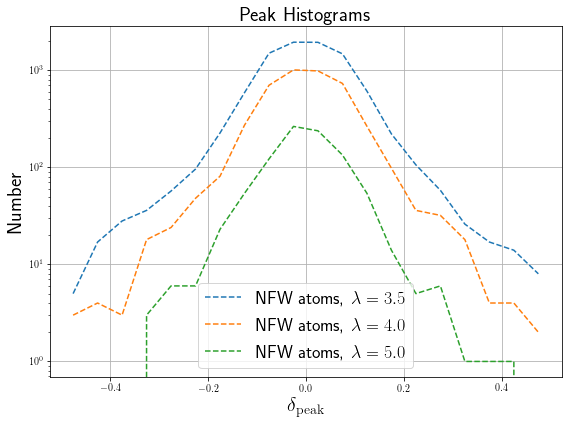

In [123]:
plt.figure(figsize=(8,6))
nmlist=['f3-1','f3-2','f3-3']
lblist=['NFW atoms, $\lambda=3.5$','NFW atoms, $\lambda=4.0$','NFW atoms, $\lambda=5.0$']

for inm,nmp2 in enumerate(nmlist):
    histP=np.zeros(20)
    i=800
    j=800
    a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nmp2,i,j))
    mask=(a['iz']<=19)
    a=a[mask]
    histP+=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=20,range=(-0.5,0.5),density=False)[0]
    print(len(a))
    grids=np.histogram(a['value'],bins=20,range=(-0.5,0.5),density=False)[1]
    grids=(grids[1:]+grids[:-1])/2.
    plt.plot(grids,histP,'--',label=r'%s'%lblist[inm])
    plt.yscale('log')
plt.title('Peak Histograms',fontsize=20)
plt.legend(fontsize=18)
plt.grid()
plt.xlabel(r'$\delta_{\rm{peak}}$',fontsize=20)
plt.ylabel('Number',fontsize=20)
plt.tight_layout()
#plt.savefig(os.path.join(figMsDir,'peak_histograms.pdf'))

In [124]:
a=pyfits.getdata('./planck-cosmo/pix96-ns10/halo800800/pixShearR-g1-800800-sim999.fits')
b=pyfits.getdata('./planck-cosmo/pix96-ns10/halo800800/pixShearR-g1-800800-sim0.fits')

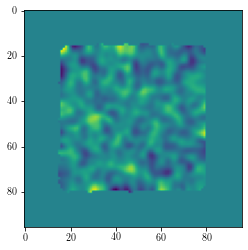

In [80]:
imshow(a[0])

In [72]:
assert np.all(a['raH']==b['raH'])
assert np.all(a['zbest']==b['zbest'])